# BA305 Group Project: Final Exam Scores

## **Problem to Solve:**

*   With competitiveness in academics rising, people are always looking to find an edge and score above the competition.
*   Aiming to improve student performance on exams by finding out which factors affect exam scores the most.


## **Dataset Used**

*   20 columns with 6608 rows of student records
*   Dataset source: https://www.kaggle.com/datasets/lainguyn123/student-performance-factors




Information of Students
1. Hours Studied: (# of hours, rounded)
2. Attendance: (as a percentage, 0-100%)
3. Parental Involvement: (low, medium, high)
4. Access to Resources (low, medium, high)
5. Extracurricular Activities (yes, no)
6. Sleep Hours: (# of hours, rounded)
7. Previous Score: (0-100)
8. Motivation Level: (low, medium, high)
9. Internet Access: (yes, no)
10. Tutoring Sessions: (0-8)
11. Family Income: (low, medium, high)
12. Teacher Quality: (low, medium, high)
13. School Type: (public, private)
14. Peer Influence: (negative, neutral, positive)
15. Physical Activity: (0-6)
16. Learning Disabilities: (yes, no)
17. Parental Education Level: (high school, college, postgraduate)
18. Distance from School: (near, moderate, far)
19. Gender: (male, female)
20. Exam Score: (final score, 0-100)

# Importing of Needed Packages

In [1]:
%matplotlib inline
from sklearn import tree
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from tqdm import tqdm
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pylab as plt
from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import *
import seaborn as sns

np.set_printoptions(suppress=True)

In [2]:
school_df = pd.read_csv('StudentPerformanceFactors.csv')
school_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6607 entries, 0 to 6606
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Hours_Studied               6607 non-null   int64 
 1   Attendance                  6607 non-null   int64 
 2   Parental_Involvement        6607 non-null   object
 3   Access_to_Resources         6607 non-null   object
 4   Extracurricular_Activities  6607 non-null   object
 5   Sleep_Hours                 6607 non-null   int64 
 6   Previous_Scores             6607 non-null   int64 
 7   Motivation_Level            6607 non-null   object
 8   Internet_Access             6607 non-null   object
 9   Tutoring_Sessions           6607 non-null   int64 
 10  Family_Income               6607 non-null   object
 11  Teacher_Quality             6529 non-null   object
 12  School_Type                 6607 non-null   object
 13  Peer_Influence              6607 non-null   obje

In [3]:
school_df.head()

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,Low,High,No,7,73,Low,Yes,0,Low,Medium,Public,Positive,3,No,High School,Near,Male,67
1,19,64,Low,Medium,No,8,59,Low,Yes,2,Medium,Medium,Public,Negative,4,No,College,Moderate,Female,61
2,24,98,Medium,Medium,Yes,7,91,Medium,Yes,2,Medium,Medium,Public,Neutral,4,No,Postgraduate,Near,Male,74
3,29,89,Low,Medium,Yes,8,98,Medium,Yes,1,Medium,Medium,Public,Negative,4,No,High School,Moderate,Male,71
4,19,92,Medium,Medium,Yes,6,65,Medium,Yes,3,Medium,High,Public,Neutral,4,No,College,Near,Female,70


# Data Cleaning

In [4]:
# Turning all the categorical variables into dummies
school_df['Parental_Involvement'] = school_df['Parental_Involvement'].replace({'Low': 1,
                             'Medium': 2, 'High': 3})

school_df['Access_to_Resources'] = school_df['Access_to_Resources'].replace({'Low': 1,
                             'Medium': 2, 'High': 3})

school_df['Extracurricular_Activities'] = school_df['Extracurricular_Activities'].replace({'Yes': 1,
                             'No': 0})

school_df['Motivation_Level'] = school_df['Motivation_Level'].replace({'Low': 1,
                             'Medium': 2, 'High': 3})

school_df['Internet_Access'] = school_df['Internet_Access'].replace({'Yes': 1,
                             'No': 0})

school_df['Family_Income'] = school_df['Family_Income'].replace({'Low': 1,
                             'Medium': 2, 'High': 3})

school_df['Teacher_Quality'] = school_df['Teacher_Quality'].replace({'Low': 1,
                             'Medium': 2, 'High': 3})

school_df['School_Type'] = school_df['School_Type'].replace({'Public': 1,
                             'Private': 0})

school_df['Peer_Influence'] = school_df['Peer_Influence'].replace({'Negative': 1,
                             'Positive': 2, 'Neutral': 3})

school_df['Learning_Disabilities'] = school_df['Learning_Disabilities'].replace({'Yes': 1,
                             'No': 0})

school_df['Parental_Education_Level'] = school_df['Parental_Education_Level'].replace({'High School': 1,
                             'College': 2, 'Postgraduate': 3})

school_df['Distance_from_Home'] = school_df['Distance_from_Home'].replace({'Near': 1,
                             'Moderate': 2, 'Far': 3})

school_df['Gender'] = school_df['Gender'].replace({'Male': 1,
                             'Female': 0})

/var/folders/8h/2dlvh_rx3pg7vd65zq_d4v700000gn/T/ipykernel_76249/455895473.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  school_df['Parental_Involvement'] = school_df['Parental_Involvement'].replace({'Low': 1,
/var/folders/8h/2dlvh_rx3pg7vd65zq_d4v700000gn/T/ipykernel_76249/455895473.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  school_df['Access_to_Resources'] = school_df['Access_to_Resources'].replace({'Low': 1,
/var/folders/8h/2dlvh_rx3pg7vd65zq_d4v700000gn/T/ipykernel_76249/455895473.py:8: FutureWarning: Downcastin

After some contemplation, we decided to remove previous exam score from our list of variables. We did this as we did not believe previous exam score would not affect how a student would perform on their final exam, and thus is not a useful predictor.

In [5]:
school_df.head(20)
#drop the coloum "Precious_Scores"
school_df = school_df.drop('Previous_Scores', axis=1)
school_df_clean = school_df.dropna()
school_df_clean.head()

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,1,3,0,7,1,1,0,1,2.0,1,2,3,0,1.0,1.0,1,67
1,19,64,1,2,0,8,1,1,2,2,2.0,1,1,4,0,2.0,2.0,0,61
2,24,98,2,2,1,7,2,1,2,2,2.0,1,3,4,0,3.0,1.0,1,74
3,29,89,1,2,1,8,2,1,1,2,2.0,1,1,4,0,1.0,2.0,1,71
4,19,92,2,2,1,6,2,1,3,2,3.0,1,3,4,0,2.0,1.0,0,70


In [6]:
predictors = list(school_df.columns)
predictors.remove('Exam_Score')
X = school_df_clean[predictors]
y = school_df_clean['Exam_Score']

In [7]:
# Split our Data in 80-20
X_train,X_test,y_train,y_test = train_test_split(X,y, test_size=0.2)
print('Training set:', X_train.shape, 'Testing set:', X_test.shape)

Training set: (5102, 18) Testing set: (1276, 18)


In [8]:
scaler = preprocessing.StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Linear Regression

In [9]:
# Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Initialize the model
lr = LinearRegression()

# Fit the model
lr.fit(X_train, y_train)

# Predict on test set
lr_pred = lr.predict(X_test)

# Evaluate performance
mse = mean_squared_error(y_test, lr_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, lr_pred)

print(f"Linear Regression RMSE: {rmse:.2f}")
print(f"Linear Regression R²:   {r2:.3f}")

Linear Regression RMSE: 2.38
Linear Regression R²:   0.633


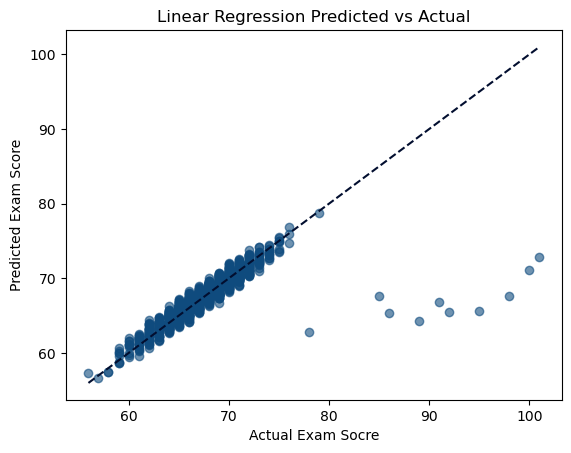

In [10]:
# Show the actual vs predicted for linear regression
plt.scatter(y_test, lr_pred
            , color='#0f4b7e', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         color='#020e2f', linestyle='--')
plt.title('Linear Regression Predicted vs Actual')
plt.xlabel('Actual Exam Socre')
plt.ylabel('Predicted Exam Score')
plt.show()


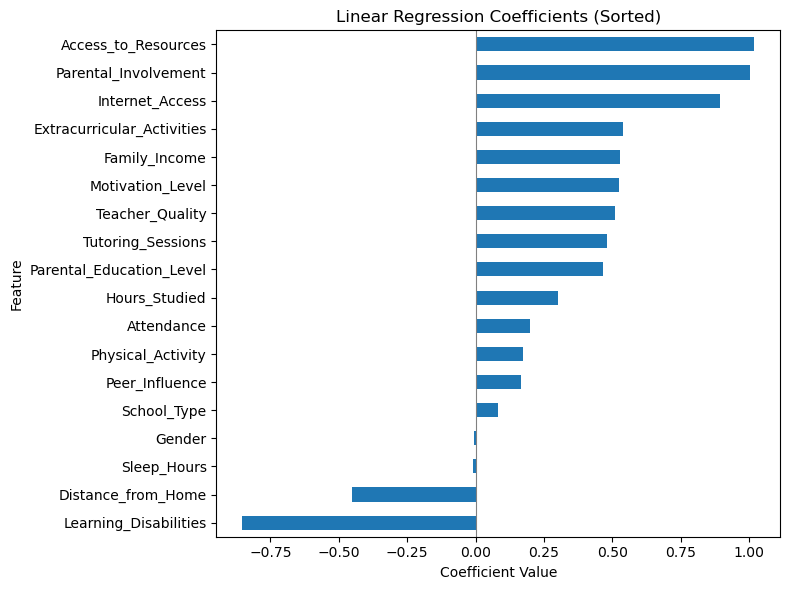

In [11]:

# Turn your coefficients into a Series indexed by feature name
coefs = pd.Series(lr.coef_, index=X_train.columns)

# Sort from most negative to most positive
coefs_sorted = coefs.sort_values()

# Plot horizontal bars
plt.figure(figsize=(8, 6))
coefs_sorted.plot(kind='barh')
plt.axvline(0, color='grey', linewidth=0.8)    # zero line
plt.ylabel('Feature')
plt.xlabel('Coefficient Value')
plt.title('Linear Regression Coefficients (Sorted)')
plt.tight_layout()
plt.show()

# KNN

First, we ran our initial KNN without any modifications to the data. We found the best K for our dataset both for standard KNN and in terms of finding rmse.

In [12]:
# Choosing the best k for the validation set
# using a 'for' loop and range(start, stop, step)
results = []
for k in tqdm(range(1, 151, 1)):
    # Create and fit the kNN regressor
    knn = KNeighborsRegressor(n_neighbors=k).fit(X_train_scaled, y_train)

    # Predict on the test set
    predictions = knn.predict(X_test_scaled)

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test, predictions))

    # Store the results in a dictionary
    results.append({
        'k': k,
        'rmse': rmse
    })

# convert results to a pandas dataframe for better visualization
results_df = pd.DataFrame(results)
results_df

100%|██████████| 150/150 [00:06<00:00, 24.93it/s]


,k,rmse
0,1,3.648335
1,2,3.232682
2,3,3.141059
3,4,3.073375
4,5,3.013382
...,...,...
145,146,3.004495
146,147,3.005058
147,148,3.005621
148,149,3.007041


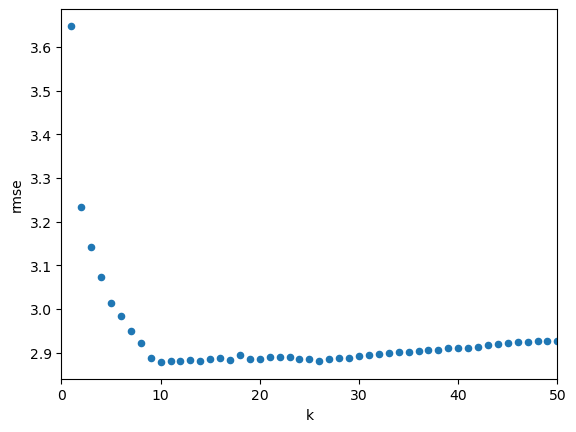

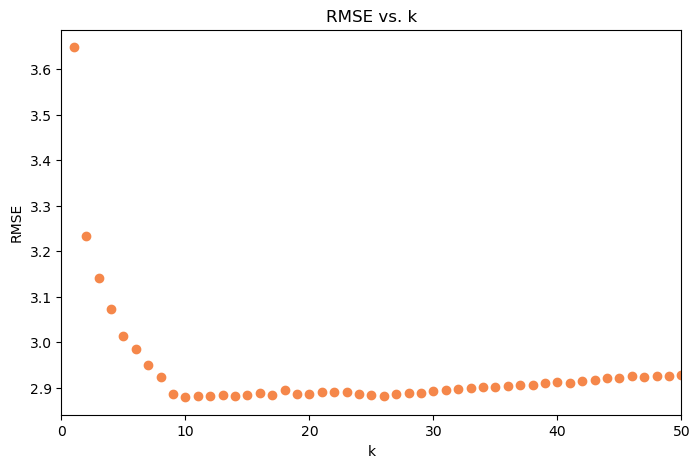

In [13]:
# plot RMSE vs. k
results_df.plot.scatter(x='k', y='rmse', xlim=[0, 50]);
plt.figure(figsize=(8,5))
plt.scatter(results_df['k'], results_df['rmse'], color='#f5874a')
plt.xlim(0, 50)
plt.title('RMSE vs. k')
plt.xlabel('k')
plt.ylabel('RMSE')
plt.show()

In [14]:
# Find the best K in terms of R square
from sklearn.metrics import r2_score
results = []
for k in tqdm(range(1, 151, 1)):
    # Fit the KNeighborsRegressor model for the given k
    knn = KNeighborsRegressor(n_neighbors=k).fit(X_train_scaled, y_train)

    # Make predictions on the test set
    predictions = knn.predict(X_test_scaled)

    # Calculate the R^2 score
    r2 = r2_score(y_test, predictions)

    # Append the results for this k value
    results.append({
        'k': k,
        'r2': r2
    })

# Convert the results list to a pandas DataFrame for visualization
results_df = pd.DataFrame(results)
results_df

100%|██████████| 150/150 [00:05<00:00, 26.55it/s]


,k,r2
0,1,0.137742
1,2,0.323023
2,3,0.360854
3,4,0.388103
4,5,0.411758
...,...,...
145,146,0.415223
146,147,0.415003
147,148,0.414784
148,149,0.414231


In [15]:
#Run KNN
knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X_train_scaled, y_train)
knn_pred = knn.predict(X_test_scaled)
print('R_squared:', knn.score(X_test_scaled,y_test))
rmse_knn = np.sqrt(mean_squared_error(y_test,knn_pred))
print("KNN RMSE:", rmse_knn)

R_squared: 0.4630659629748122
KNN RMSE: 2.8789665291319504


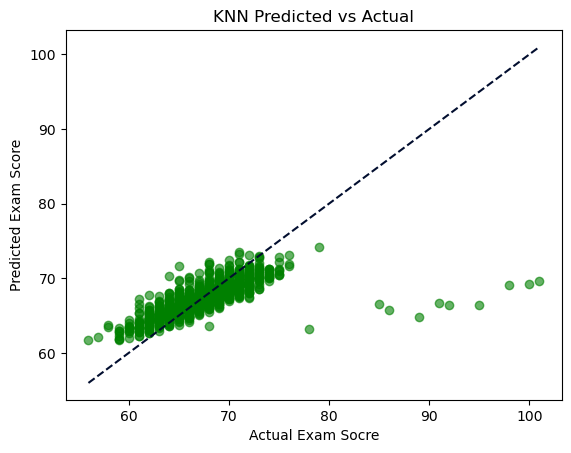

In [16]:
# Show KNN graph of predicted vs actual
plt.scatter(y_test, knn_pred
            , color='green', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         color='#020e2f', linestyle='--')
plt.title('KNN Predicted vs Actual')
plt.xlabel('Actual Exam Socre')
plt.ylabel('Predicted Exam Score')
plt.show()

In [17]:
#Naive Benchmark
y_naive = np.full((len(y_test),1),y_train.mean())
rmse_naive = np.sqrt(mean_squared_error(y_test,y_naive))
y_naive

array([[67.21971776],
       [67.21971776],
       [67.21971776],
       ...,
       [67.21971776],
       [67.21971776],
       [67.21971776]])

In [18]:
# Naive results
print("Naive RMSE:", rmse_naive)

Naive RMSE: 3.932282886799051


# Decision Tree

We tried multiple methods under the decision tree:


*   Full Tree
*   Pruned Tree
*   Random Forests
*   Boosting



In [19]:
school_df_clean

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,1,3,0,7,1,1,0,1,2.0,1,2,3,0,1.0,1.0,1,67
1,19,64,1,2,0,8,1,1,2,2,2.0,1,1,4,0,2.0,2.0,0,61
2,24,98,2,2,1,7,2,1,2,2,2.0,1,3,4,0,3.0,1.0,1,74
3,29,89,1,2,1,8,2,1,1,2,2.0,1,1,4,0,1.0,2.0,1,71
4,19,92,2,2,1,6,2,1,3,2,3.0,1,3,4,0,2.0,1.0,0,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6602,25,69,3,2,0,7,2,1,1,3,2.0,1,2,2,0,1.0,1.0,0,68
6603,23,76,3,2,0,8,2,1,3,1,3.0,1,2,2,0,1.0,1.0,0,69
6604,20,90,2,1,1,6,1,1,3,1,2.0,1,1,2,0,3.0,1.0,0,68
6605,10,86,3,3,1,6,3,1,2,1,2.0,0,2,3,0,1.0,3.0,0,68


In [20]:
y_reg = school_df_clean['Exam_Score']
X_reg = school_df_clean[predictors]

In [21]:
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_reg, test_size=0.2, random_state=0)

In [22]:
# Decision Tree
# Build "Full Tree"
full_clf = DecisionTreeRegressor(random_state=0)
full_clf.fit(X_train_reg, y_train_reg)

DecisionTreeRegressor(random_state=0)

In [23]:
print('Number of nodes', full_clf.tree_.node_count)

Number of nodes 6013


In [24]:
# Text representation of full tree
text_representation = tree.export_text(full_clf)
print(text_representation)

|--- feature_1 <= 82.50
|   |--- feature_0 <= 20.50
|   |   |--- feature_1 <= 70.50
|   |   |   |--- feature_0 <= 15.50
|   |   |   |   |--- feature_3 <= 1.50
|   |   |   |   |   |--- feature_0 <= 10.50
|   |   |   |   |   |   |--- feature_11 <= 0.50
|   |   |   |   |   |   |   |--- feature_5 <= 8.00
|   |   |   |   |   |   |   |   |--- feature_13 <= 2.50
|   |   |   |   |   |   |   |   |   |--- value: [60.00]
|   |   |   |   |   |   |   |   |--- feature_13 >  2.50
|   |   |   |   |   |   |   |   |   |--- value: [59.00]
|   |   |   |   |   |   |   |--- feature_5 >  8.00
|   |   |   |   |   |   |   |   |--- feature_5 <= 9.50
|   |   |   |   |   |   |   |   |   |--- value: [58.00]
|   |   |   |   |   |   |   |   |--- feature_5 >  9.50
|   |   |   |   |   |   |   |   |   |--- value: [57.00]
|   |   |   |   |   |   |--- feature_11 >  0.50
|   |   |   |   |   |   |   |--- feature_15 <= 1.50
|   |   |   |   |   |   |   |   |--- value: [55.00]
|   |   |   |   |   |   |   |--- feature_15 >  1.

In [25]:
# Visualize the full tree via "plot_tree" function

# First, re-size the figure via matplotlib(otherwise it will be too small)
plt.figure(figsize=(15,10))

# Then call plot_tree() function
# the 'filled' option generates colors in the nodes
tree.plot_tree(full_clf, filled=True);

In [26]:
# Feed input data to model to predict y output, for training data and test data, separately
y_pred_train = full_clf.predict(X_train_reg)
y_pred_test = full_clf.predict(X_test_reg)

In [27]:
# Accuracy of full tree on training and test sets
train_score = np.sqrt(mean_squared_error(y_train_reg, y_pred_train))
test_score = np.sqrt(mean_squared_error(y_test_reg, y_pred_test))

print('RMSE of full tree on training data =', round(train_score, 2))
print('RMSE of full tree on testing data =', round(test_score, 2))

RMSE of full tree on training data = 0.0
RMSE of full tree on testing data = 3.64


In [28]:
# Shrink the Tree
pruning_clf = DecisionTreeRegressor(
      max_depth=10,
      min_samples_split = 20,
      min_samples_leaf = 20,
      min_impurity_decrease = 0.01,
      criterion = 'squared_error')
pruning_clf.fit(X_train_reg, y_train_reg)

DecisionTreeRegressor(max_depth=10, min_impurity_decrease=0.01,
                      min_samples_leaf=20, min_samples_split=20)

In [29]:
# Plot the reduced tree
fig = plt.figure(figsize=(25,10))
tree.plot_tree(pruning_clf, fontsize=12, feature_names=X_reg.columns, filled=True);

Run a new accuracy test on the new tree

In [30]:
%%capture
!pip install dtreeviz
import dtreeviz

In [31]:
viz = dtreeviz.model(pruning_clf,
               X_train=X_train_reg,
               y_train=y_train_reg,
               target_name='Exam_Score',
               feature_names=X_reg.columns);
viz.view(scale=1.8, fontname='DejaVu Sans')

/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


In [32]:
y_pred_reg = pruning_clf.predict(X_test_reg)
rmse = np.sqrt(mean_squared_error(y_test_reg,y_pred_reg))
r2 = r2_score(y_test, y_pred_reg)
print("RMSE=", round(rmse,3), "R2=", round(r2,3))

RMSE= 2.722 R2= -0.641


In [33]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_depth': [4, 6, 8, 10],
    'min_samples_split': [2, 5, 10, 20],
    'min_samples_leaf': [1, 5, 10, 20],
}

grid_search = GridSearchCV(
    DecisionTreeRegressor(random_state=0),
    param_grid,
    scoring='neg_root_mean_squared_error',
    cv=5
)

grid_search.fit(X_train_reg, y_train_reg)

print('Best params:', grid_search.best_params_)
print('Best RMSE:', -grid_search.best_score_)


Best params: {'max_depth': 10, 'min_samples_leaf': 20, 'min_samples_split': 2}
Best RMSE: 2.690562653484687


In [34]:
importances = pruning_clf.feature_importances_
df_importances = pd.DataFrame({
    'Feature': X_train_reg.columns,
    'Importance': importances})
df_importances = df_importances.sort_values(by='Importance', ascending=False)
print(df_importances.to_string(index=False))

                   Feature  Importance
                Attendance    0.562568
             Hours_Studied    0.328802
       Access_to_Resources    0.040228
      Parental_Involvement    0.026916
         Tutoring_Sessions    0.022879
           Teacher_Quality    0.005136
             Family_Income    0.005118
          Motivation_Level    0.004501
                    Gender    0.001394
  Parental_Education_Level    0.001274
               School_Type    0.001184
           Internet_Access    0.000000
               Sleep_Hours    0.000000
Extracurricular_Activities    0.000000
            Peer_Influence    0.000000
         Physical_Activity    0.000000
     Learning_Disabilities    0.000000
        Distance_from_Home    0.000000


# Random Forest

In [35]:
# Random Forest
# Import the Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor

In [36]:
# Run the Ramdom Forest Regressor
rf = RandomForestRegressor(
    n_estimators=1000,
    random_state=0,
    max_depth=10,
    min_samples_leaf=5,
    criterion='squared_error',
    n_jobs = -1)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)

In [37]:
mse = mean_squared_error(y_test, rf_pred)
rmse = np.sqrt(mse)
print("RMSE:", rmse)

RMSE: 2.5983442527279297


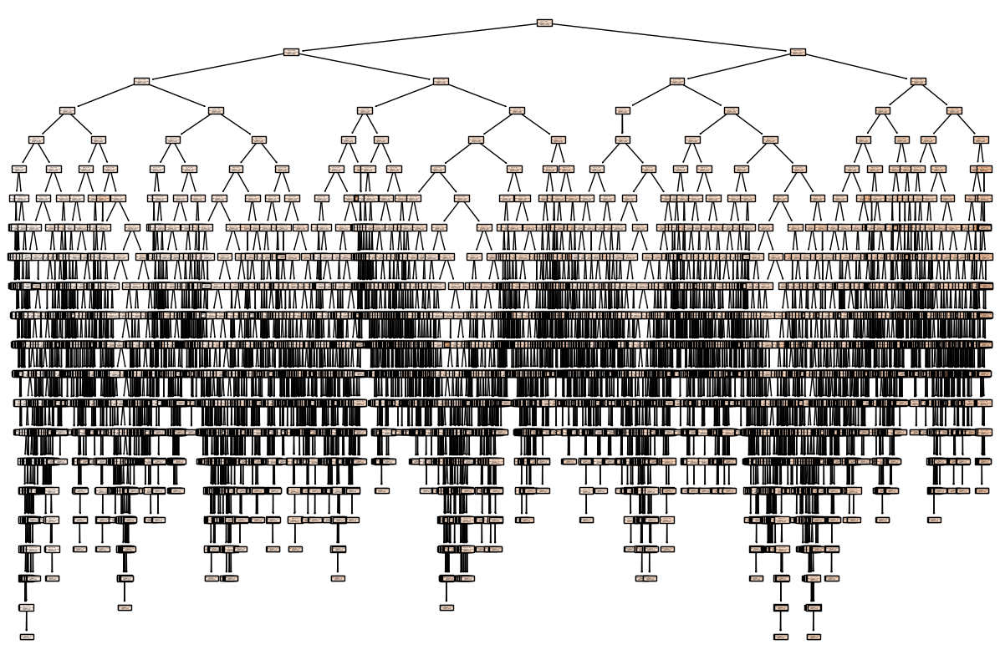

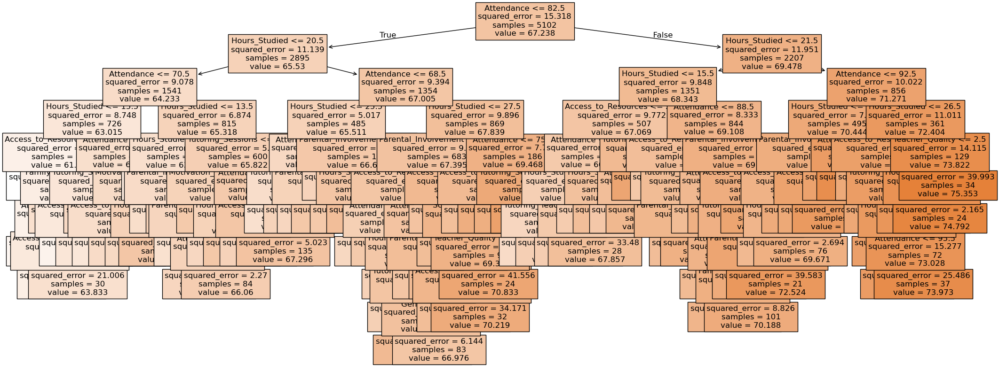

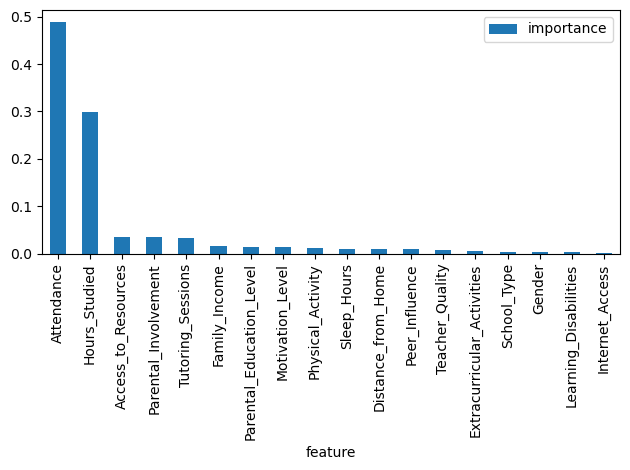

In [38]:
importances_2 = rf.feature_importances_

# create a dataframe to store the values and their labels
df2 = pd.DataFrame({'feature': X_train.columns, 'importance': importances_2})

# sort dataframe by descending order, showing the most important feature top
df2 = df2.sort_values('importance', ascending = False)

# plot the importance of each feature
ax = df2.plot(kind='bar', x='feature')

plt.tight_layout()
plt.show()

In [39]:
importances_2 = rf.feature_importances_

df2 = pd.DataFrame({'feature': X_train.columns, 'importance': importances_2})
df2 = df2.sort_values('importance', ascending = False)
print(df2.to_string(index=False))


                   feature  importance
                Attendance    0.489692
             Hours_Studied    0.299495
       Access_to_Resources    0.035667
      Parental_Involvement    0.034380
         Tutoring_Sessions    0.031934
             Family_Income    0.015595
  Parental_Education_Level    0.013424
          Motivation_Level    0.012925
         Physical_Activity    0.010923
               Sleep_Hours    0.010463
        Distance_from_Home    0.009806
            Peer_Influence    0.009762
           Teacher_Quality    0.006572
Extracurricular_Activities    0.005879
               School_Type    0.004417
                    Gender    0.004327
     Learning_Disabilities    0.003437
           Internet_Access    0.001302


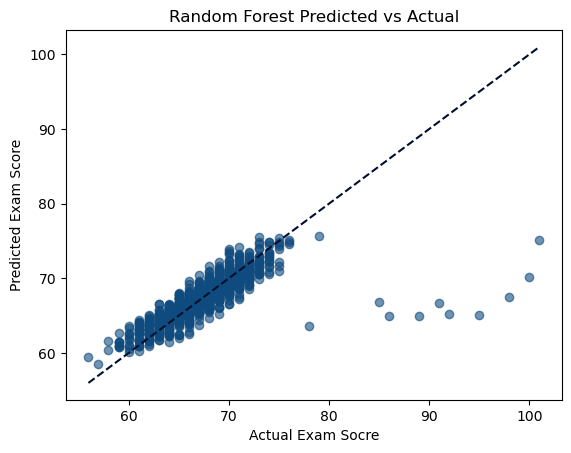

In [40]:
# Plot Random forest predicted vs actual
plt.scatter(y_test, rf_pred
            , color='#0f4b7e', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         color='#020e2f', linestyle='--')
plt.title('Random Forest Predicted vs Actual')
plt.xlabel('Actual Exam Socre')
plt.ylabel('Predicted Exam Score')
plt.show()

# PCA

We used PCA to view the correlation between our explanatory variables and see if our data could be shrunk down into smaller components that kept the same explanatory power.

In [41]:
corr_mat = school_df_clean.corr()
corr_mat

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
Hours_Studied,1.000000,-0.004997,-0.014909,-0.003775,-0.008377,0.013119,-0.011388,0.006414,-0.009654,0.001270,-0.006896,0.001167,-0.004641,0.003183,-0.013920,-0.007989,0.017255,-0.007192,0.445104
Attendance,-0.004997,1.000000,-0.008309,-0.012321,-0.001754,-0.019602,-0.002571,-0.019404,0.012070,-0.011792,-0.001722,-0.020981,0.024779,-0.022976,-0.020877,0.026405,-0.020411,0.004621,0.580259
Parental_Involvement,-0.014909,-0.008309,1.000000,-0.029224,-0.022678,-0.004466,-0.023297,0.014847,-0.003097,0.010478,0.014453,-0.014647,0.009728,-0.005511,0.008045,-0.007353,-0.004224,-0.016510,0.156014
Access_to_Resources,-0.003775,-0.012321,-0.029224,1.000000,-0.012197,-0.013591,0.006973,-0.017271,-0.014926,-0.004921,-0.011753,-0.025937,-0.011734,-0.012854,-0.005544,-0.005342,0.000216,0.002283,0.167856
Extracurricular_Activities,-0.008377,-0.001754,-0.022678,-0.012197,1.000000,0.003025,0.015795,-0.004227,0.006323,-0.005588,0.015479,0.006503,-0.025647,-0.001597,-0.011197,0.003508,0.013910,0.007540,0.063063
Sleep_Hours,0.013119,-0.019602,-0.004466,-0.013591,0.003025,1.000000,0.000695,0.012072,-0.011466,-0.016052,0.010133,0.000689,0.005573,-0.002898,0.014177,0.011317,0.000105,-0.009938,-0.017171
Motivation_Level,-0.011388,-0.002571,-0.023297,0.006973,0.015795,0.000695,1.000000,0.021564,0.005432,0.008054,-0.012832,0.013749,0.002761,-0.011175,-0.006271,-0.005178,0.000911,0.015254,0.088502
Internet_Access,0.006414,-0.019404,0.014847,-0.017271,-0.004227,0.012072,0.021564,1.000000,-0.009483,-0.001440,0.001635,0.010502,-0.005038,-0.014506,0.005402,-0.002944,0.006463,0.014907,0.051124
Tutoring_Sessions,-0.009654,0.012070,-0.003097,-0.014926,0.006323,-0.011466,0.005432,-0.009483,1.000000,0.004553,0.000194,0.005481,-0.000848,0.016325,0.006698,0.004503,-0.016185,-0.005571,0.156829
Family_Income,0.001270,-0.011792,0.010478,-0.004921,-0.005588,-0.016052,0.008054,-0.001440,0.004553,1.000000,-0.004678,0.011872,0.010356,-0.023344,0.014188,0.000998,-0.013185,0.000332,0.094555


In [42]:
# easier to interpret using a heatmap with colormap, from the seaborn package
# list of available color maps: https://matplotlib.org/stable/tutorials/colors/colormaps.html
# if we only care about the magnitude of corr, not the sign
# it's best to use grayscale
plt.figure(figsize=(14,7))
sns.heatmap(np.absolute(corr_mat), annot=True, fmt=".1f", vmin=0, vmax=1, cmap="gray_r");

In [43]:
# Run PCA on unstandardized data
# PCA will create an object called a 'class'
# Let's also purposely limit the number of components to display to 12
# To make things easier to read for the class setting...

pcs = PCA(n_components=12)
# Then we use the "fit" function to run the PCA on a specific dataframe
# It will run the model in the background but won't show you anything...
pcs.fit(school_df_clean)

PCA(n_components=12)

In [44]:
# to view the variance explained, we need to use the explained_variance_ratio_
# function
print(pcs.explained_variance_ratio_.round(3))
# use the cumulative sum function to keep track of total variance explained
print(np.cumsum(pcs.explained_variance_ratio_).round(3))

[0.716 0.203 0.033 0.011 0.007 0.005 0.003 0.003 0.003 0.003 0.002 0.002]
[0.716 0.919 0.952 0.963 0.97  0.976 0.979 0.982 0.985 0.987 0.99  0.992]


In [45]:
# we are going to create a new dataframe to store the output
pcsSummary_df = pd.DataFrame({
            '% of variance explained': pcs.explained_variance_ratio_,
            'Cumulative % explained': np.cumsum(pcs.explained_variance_ratio_)
             })
# round(3) function rounds to 3 decimals
pcsSummary_df.round(3)

,% of variance explained,Cumulative % explained
0,0.716,0.716
1,0.203,0.919
2,0.033,0.952
3,0.011,0.963
4,0.007,0.970
5,0.005,0.976
6,0.003,0.979
7,0.003,0.982
8,0.003,0.985
9,0.003,0.987


In [46]:
pcs.components_.round(3)
# careful: the components_ function puts the components on the rows, and the
# original variables on the columns. This is the opposite of the format we
# have in our slides, so we will need to transpose

# transform array to dataframe, and don't forget to transpose so we have the data
# in the same format as the slides
pcs_df = pd.DataFrame(pcs.components_).round(2).transpose()
pcs_df

# let's now also add the names of the variables back
# in dataframe, options "index" allows one to specify a name for each row

# let's first recover the names of the columns in the metric dataframe
var = list(school_df_clean.columns)
print(var)

#now we can add those column names to the new dataframe, via the 'index' option
pcs_df.index = [var]
pcs_df

['Hours_Studied', 'Attendance', 'Parental_Involvement', 'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours', 'Motivation_Level', 'Internet_Access', 'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 'School_Type', 'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities', 'Parental_Education_Level', 'Distance_from_Home', 'Gender', 'Exam_Score']


,0,1,2,3,4,5,6,7,8,9,10,11
Hours_Studied,0.02,0.94,-0.32,-0.01,0.04,0.00,0.01,0.01,0.01,-0.00,-0.00,0.00
Attendance,0.98,-0.09,-0.19,-0.00,0.02,0.00,0.00,0.00,0.01,-0.00,-0.00,0.00
Parental_Involvement,0.00,0.00,0.07,0.00,-0.06,-0.02,-0.10,0.01,-0.05,0.73,0.13,0.22
Access_to_Resources,-0.00,0.00,0.07,-0.00,-0.07,-0.02,-0.07,-0.18,-0.22,-0.47,-0.55,0.17
Extracurricular_Activities,0.00,0.00,0.02,0.00,-0.01,-0.00,0.01,-0.03,-0.01,-0.02,0.03,0.01
Sleep_Hours,-0.00,0.00,-0.02,1.00,0.02,0.00,-0.01,-0.01,0.01,-0.00,-0.01,0.00
Motivation_Level,0.00,0.00,0.04,0.00,-0.03,-0.02,-0.06,-0.05,-0.04,-0.46,0.82,0.08
Internet_Access,-0.00,0.00,0.01,0.00,-0.01,-0.00,-0.00,-0.00,-0.00,0.01,0.01,0.00
Tutoring_Sessions,0.00,0.00,0.14,-0.01,0.99,-0.03,0.01,0.01,0.01,-0.01,-0.01,0.02
Family_Income,-0.00,0.00,0.05,-0.01,-0.03,-0.04,-0.14,0.11,0.95,-0.11,-0.09,0.07


After finding the initial PCA correlation matrix, we scale the data to make sure that our results are free of potential issues.

In [47]:
#Evaluate the Ramdom Forest Results
mse_rf = mean_squared_error(y_test, rf_pred)
rmse_rf = mse_rf ** 0.5
r2_rf   = r2_score(y_test, rf_pred)

print(f"RMSE: {rmse_rf:.2f}")
print(f"R²:   {r2_rf:.3f}")

RMSE: 2.60
R²:   0.563


In [48]:
# Scaling Standardization (0 mean, unit variance) is done via the sklearn.preprocessing scale() function
scaled_array = preprocessing.scale(school_df_clean)
print(scaled_array)

#convert the array back to a dataframe to help with visualization of the data
scaled_df = pd.DataFrame(scaled_array)
print(scaled_df)

[[ 0.50507871  0.34452035 -1.56187552 ... -0.7514487   0.85404486
  -0.06441555]
 [-0.16325988 -1.38710878 -1.56187552 ...  0.74022257 -1.17089868
  -1.59740955]
 [ 0.67216335  1.55666073 -0.12295568 ... -0.7514487   0.85404486
   1.72407745]
 ...
 [ 0.00382477  0.86400908 -0.12295568 ... -0.7514487  -1.17089868
   0.19108345]
 [-1.66702171  0.51768326  1.31596417 ...  2.23189385 -1.17089868
   0.19108345]
 [-0.83159847 -1.12736441 -0.12295568 ... -0.7514487   0.85404486
  -0.83091255]]
            0         1         2         3         4         5         6   \
0     0.505079  0.344520 -1.561876  1.290975 -1.216859 -0.023819 -1.305103   
1    -0.163260 -1.387109 -1.561876 -0.140499 -1.216859  0.657418 -1.305103   
2     0.672163  1.556661 -0.122956 -0.140499  0.821788 -0.023819  0.132291   
3     1.507587  0.777428 -1.561876 -0.140499  0.821788  0.657418  0.132291   
4    -0.163260  1.037172 -0.122956 -0.140499  0.821788 -0.705056  0.132291   
...        ...       ...       ...      

In [49]:
#check that the scale function worked as intended, that is, it created columns with zero mean and unit variance
pd.DataFrame({
              'mean':scaled_df.mean(),
              'stdev': scaled_df.std()
              }).transpose().round(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
mean,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,-0.0,-0.0,-0.0,-0.0
stdev,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [50]:
# PCA after scaling
pcs = PCA(n_components=12)
pcs.fit(scaled_df)

# view the importance of principal components
pcsSummary_df = pd.DataFrame({
            'Proportion of variance': pcs.explained_variance_ratio_,
            'Cumulative proportion': np.cumsum(pcs.explained_variance_ratio_)
            })
pcsSummary_df.transpose().round(3)

,0,1,2,3,4,5,6,7,8,9,10,11
Proportion of variance,0.095,0.057,0.056,0.056,0.055,0.055,0.054,0.053,0.053,0.053,0.052,0.052
Cumulative proportion,0.095,0.152,0.208,0.264,0.319,0.374,0.428,0.482,0.535,0.587,0.639,0.691


In [51]:
# Component matrix (correlations)
pd.DataFrame(pcs.components_.transpose(), index=[var]).round(2)

,0,1,2,3,4,5,6,7,8,9,10,11
Hours_Studied,0.38,-0.12,0.43,0.25,-0.15,-0.35,-0.01,-0.02,0.19,-0.15,0.16,-0.12
Attendance,0.51,0.05,-0.26,-0.13,-0.02,0.17,0.11,0.08,0.10,0.03,-0.11,0.19
Parental_Involvement,0.12,0.54,0.18,-0.11,0.03,-0.03,0.09,-0.34,-0.14,0.28,-0.08,0.01
Access_to_Resources,0.13,-0.25,-0.27,0.10,-0.21,-0.36,-0.38,-0.00,-0.42,-0.02,-0.16,0.05
Extracurricular_Activities,0.05,-0.38,0.13,-0.04,-0.02,0.47,0.08,-0.14,-0.19,-0.23,0.03,-0.19
Sleep_Hours,-0.03,0.02,0.35,-0.12,-0.15,-0.04,0.16,0.65,-0.03,-0.19,-0.09,-0.21
Motivation_Level,0.07,-0.36,0.02,-0.07,0.45,-0.01,-0.03,0.20,-0.32,0.05,-0.07,0.29
Internet_Access,0.03,-0.04,0.40,-0.19,0.30,-0.19,0.20,0.02,-0.27,0.47,-0.04,-0.00
Tutoring_Sessions,0.14,0.09,-0.08,0.27,0.20,0.46,-0.01,0.11,-0.08,0.07,0.29,0.18
Family_Income,0.08,0.16,0.04,-0.08,0.41,-0.07,-0.46,-0.17,-0.02,-0.25,0.33,-0.42


PCA shows us that the two most significant variables in affecting final test scores are Attendance & Hours Studied. However, PCA will not be used as the final model due to low explainability via the components.

# Boosting

To improve model performance we incorporated gradient boosting, where subsequent trees that are grown are trained to minimize the loss function, in this case RMSE.

Gradient boosting scales the contribution of each new model by a factor called the learning rate. Here, a small learning rate signifies that the contribution of each tree is smaller, reducing risk of overfitting but requires more trees to achieve the same level of performance.

In [52]:
#Boosting
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics     import mean_squared_error, r2_score

# 1. Initialize the boosting regressor
gb = GradientBoostingRegressor(
    n_estimators=250,     # number of boosting stages
    learning_rate=0.05,    # shrinkage to prevent overfitting
    max_depth=3,           # depth of each individual tree
    random_state=0
)

# 2. Fit on your training data
gb.fit(X_train, y_train)

# 3. Predict on the test set
y_pred_gb = gb.predict(X_test)

# 4. Evaluate performance
mse = mean_squared_error(y_test, y_pred_gb)
rmse = mse ** 0.5
r2   = r2_score(y_test, y_pred_gb)

print(f"Gradient Boosting RMSE: {rmse:.2f}")
print(f"Gradient Boosting R²:   {r2:.3f}")

Gradient Boosting RMSE: 2.43
Gradient Boosting R²:   0.617


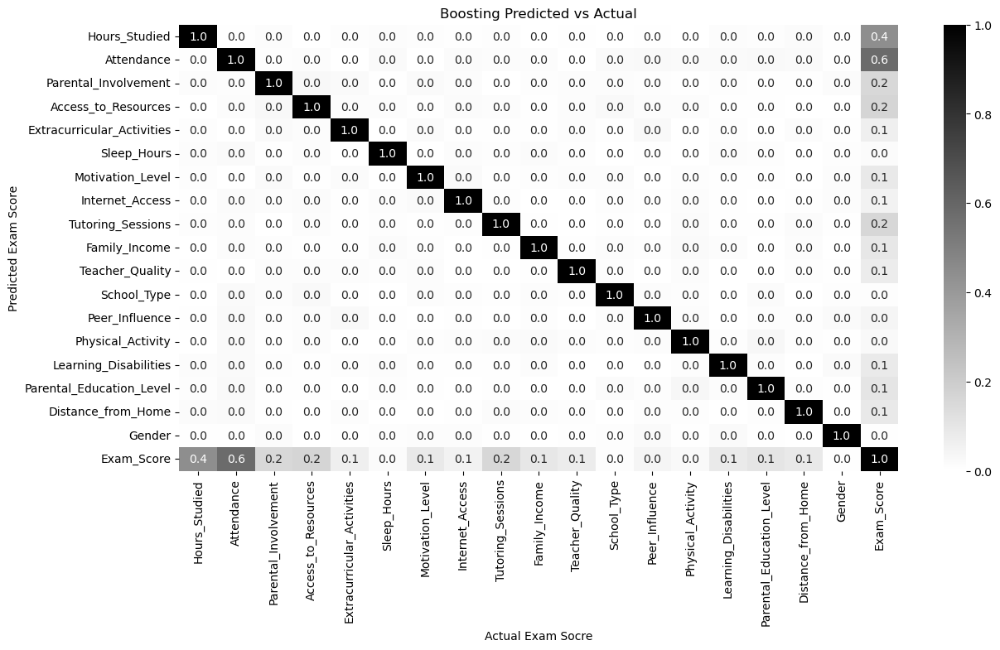

In [53]:
# Show Boosting graph of predicted vs actual
plt.scatter(y_test, y_pred_gb
            , color='#0f4b7e', alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()],
         color='#020e2f', linestyle='--')
plt.title('Boosting Predicted vs Actual')
plt.xlabel('Actual Exam Socre')
plt.ylabel('Predicted Exam Score')
plt.show()

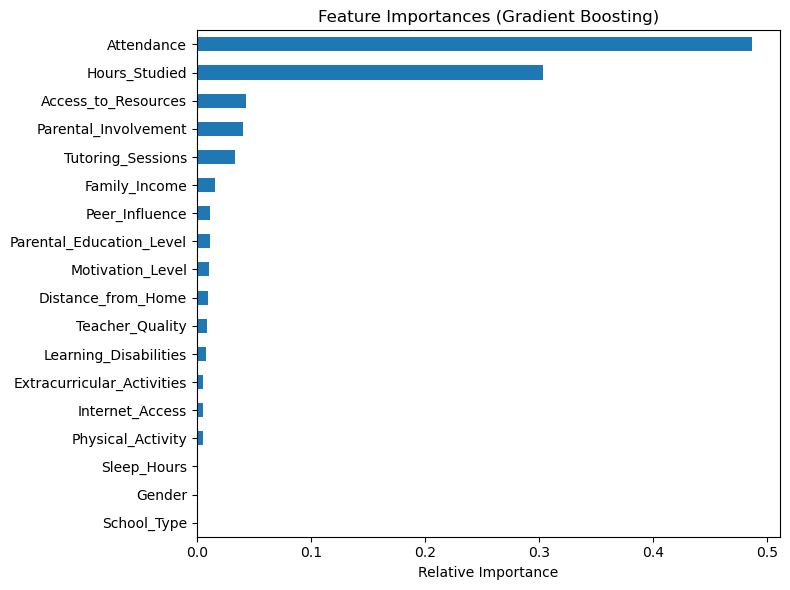

In [54]:
# 1. Extract importances and feature names
importances = gb.feature_importances_           # from your fitted GradientBoostingRegressor
feature_names = X_train.columns                 # same X_train you used to fit

# 2. Build a Series and sort it
fi = pd.Series(importances, index=feature_names).sort_values(ascending=True)

# 3. Plot horizontal bar chart
plt.figure(figsize=(8, 6))
fi.plot(kind='barh')
plt.title('Feature Importances (Gradient Boosting)')
plt.xlabel('Relative Importance')
plt.tight_layout()
plt.show()